## Model

In [1]:
import os
os.environ['KERAS_BACKEND']='tensorflow' # can choose theano, tensorflow, cntk

import keras.backend as K
if os.environ['KERAS_BACKEND'] =='tensorflow':
    channel_axis=1
    K.set_image_data_format('channels_first')
    channel_first = True
else:
    K.set_image_data_format('channels_last')
    channel_axis=-1
    channel_first = False

# 檢查是否有在使用GPU
K.tensorflow_backend._get_available_gpus()

Using TensorFlow backend.


['/job:localhost/replica:0/task:0/device:GPU:0']

In [3]:
from keras.models import Sequential, Model
from keras.layers import Conv2D, ZeroPadding2D, BatchNormalization, Input, Dropout
from keras.layers import Conv2DTranspose, Reshape, Activation, Cropping2D, Flatten
from keras.layers import Concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.activations import relu
from keras.initializers import RandomNormal

# 初始化卷積的Weights
# bias are initailized as 0
def __conv_init(a):
    print("conv_init", a)
    k = RandomNormal(0, 0.02)(a) # for convolution kernel
    k.conv_weight = True    
    return k
conv_init = RandomNormal(0, 0.02)
gamma_init = RandomNormal(1., 0.02) # for batch normalization

# Basic discriminator
def conv2d(f, *a, **k):
    return Conv2D(f, kernel_initializer = conv_init, *a, **k)
def batchnorm():
    return BatchNormalization(momentum=0.9, axis=channel_axis, epsilon=1.01e-5,
                                   gamma_initializer = gamma_init)

## Discriminator

In [5]:
nc_in = 3
nc_out = 3
ngf = 64
ndf = 64
use_lsgan = True
λ = 10 if use_lsgan else 100

# loadSize = 286
imageSize = 256
batchSize = 5
lrD = 2e-4
lrG = 2e-4

def BASIC_D(nc_in, ndf, max_layers=3, use_sigmoid=True):
    """DCGAN_D(nc, ndf, max_layers=3)
       nc: channels
       ndf: filters of the first layer
       max_layers: max hidden layers
    """    
    if channel_first:
        input_a =  Input(shape=(nc_in, None, None))
    else:
        input_a = Input(shape=(None, None, nc_in))
    _ = input_a
    _ = conv2d(ndf, kernel_size=4, strides=2, padding="same", name = 'First') (_)
    _ = LeakyReLU(alpha=0.2)(_)
    
    for layer in range(1, max_layers):        
        out_feat = ndf * min(2**layer, 8)
        _ = conv2d(out_feat, kernel_size=4, strides=2, padding="same", 
                   use_bias=False, name = 'pyramid.{0}'.format(layer)             
                        ) (_)
        _ = batchnorm()(_, training=1)        
        _ = LeakyReLU(alpha=0.2)(_)
    
    out_feat = ndf*min(2**max_layers, 8)
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(out_feat, kernel_size=4,  use_bias=False, name = 'pyramid_last') (_)
    _ = batchnorm()(_, training=1)
    _ = LeakyReLU(alpha=0.2)(_)
    
    # final layer
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(1, kernel_size=4, name = 'final'.format(out_feat, 1), 
               activation = "sigmoid" if use_sigmoid else None) (_)    
    return Model(inputs=[input_a], outputs=_)

netDA = BASIC_D(nc_in, ndf, use_sigmoid = not use_lsgan)
netDB = BASIC_D(nc_out, ndf, use_sigmoid = not use_lsgan)
netDA.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 3, None, None)     0         
_________________________________________________________________
First (Conv2D)               (None, 64, None, None)    3136      
_________________________________________________________________
leaky_re_lu_23 (LeakyReLU)   (None, 64, None, None)    0         
_________________________________________________________________
pyramid.1 (Conv2D)           (None, 128, None, None)   131072    
_________________________________________________________________
batch_normalization_33 (Batc (None, 128, None, None)   512       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 128, None, None)   0         
_________________________________________________________________
pyramid.2 (Conv2D)           (None, 256, None, None)   524288    
__________

## Generator

In [6]:
def UNET_G(isize, nc_in=3, nc_out=3, ngf=64, fixed_input_size=True):    
    max_nf = 8*ngf    
    def block(x, s, nf_in, use_batchnorm=True, nf_out=None, nf_next=None):
        # print("block",x,s,nf_in, use_batchnorm, nf_out, nf_next)
        assert s>=2 and s%2==0
        if nf_next is None:
            nf_next = min(nf_in*2, max_nf)
        if nf_out is None:
            nf_out = nf_in
        x = conv2d(nf_next, kernel_size=4, strides=2, use_bias=(not (use_batchnorm and s>2)),
                   padding="same", name = 'conv_{0}'.format(s)) (x)
        if s>2:
            if use_batchnorm:
                x = batchnorm()(x, training=1)
            x2 = LeakyReLU(alpha=0.2)(x)
            x2 = block(x2, s//2, nf_next)
            x = Concatenate(axis=channel_axis)([x, x2])            
        x = Activation("relu")(x)
        x = Conv2DTranspose(nf_out, kernel_size=4, strides=2, use_bias=not use_batchnorm,
                            kernel_initializer = conv_init,          
                            name = 'convt.{0}'.format(s))(x)        
        x = Cropping2D(1)(x)
        if use_batchnorm:
            x = batchnorm()(x, training=1)
        if s <=8:
            x = Dropout(0.5)(x, training=1)
        return x
    
    s = isize if fixed_input_size else None
    if channel_first:
        _ = inputs = Input(shape=(nc_in, s, s))
    else:
        _ = inputs = Input(shape=(s, s, nc_in))        
    _ = block(_, isize, nc_in, False, nf_out=nc_out, nf_next=ngf)
    _ = Activation('tanh')(_)
    return Model(inputs=inputs, outputs=[_])

netGB = UNET_G(imageSize, nc_in, nc_out, ngf)
netGA = UNET_G(imageSize, nc_out, nc_in, ngf)
netGA.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 3, 256, 256)  0                                            
__________________________________________________________________________________________________
conv_256 (Conv2D)               (None, 64, 128, 128) 3136        input_8[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_38 (LeakyReLU)      (None, 64, 128, 128) 0           conv_256[0][0]                   
__________________________________________________________________________________________________
conv_128 (Conv2D)               (None, 128, 64, 64)  131072      leaky_re_lu_38[0][0]             
__________________________________________________________________________________________________
batch_norm

## Count Loss

In [7]:
from keras.optimizers import RMSprop, SGD, Adam

if use_lsgan:
    loss_fn = lambda output, target : K.mean(K.abs(K.square(output-target)))
else:
    loss_fn = lambda output, target : -K.mean(K.log(output+1e-12)*target+K.log(1-output+1e-12)*(1-target))

def cycle_variables(netG1, netG2):
    real_input = netG1.inputs[0]
    fake_output = netG1.outputs[0]
    rec_input = netG2([fake_output])
    fn_generate = K.function([real_input], [fake_output, rec_input])
    return real_input, fake_output, rec_input, fn_generate

real_A, fake_B, rec_A, cycleA_generate = cycle_variables(netGB, netGA)
real_B, fake_A, rec_B, cycleB_generate = cycle_variables(netGA, netGB)

def D_loss(netD, real, fake, rec):
    output_real = netD([real])
    output_fake = netD([fake])
    loss_D_real = loss_fn(output_real, K.ones_like(output_real))
    loss_D_fake = loss_fn(output_fake, K.zeros_like(output_fake))
    loss_G = loss_fn(output_fake, K.ones_like(output_fake))
    loss_D = loss_D_real+loss_D_fake
    loss_cyc = K.mean(K.abs(rec-real))
    return loss_D, loss_G, loss_cyc

loss_DA, loss_GA, loss_cycA = D_loss(netDA, real_A, fake_A, rec_A)
loss_DB, loss_GB, loss_cycB = D_loss(netDB, real_B, fake_B, rec_B)
loss_cyc = loss_cycA+loss_cycB


loss_G = loss_GA+loss_GB+λ*loss_cyc
loss_D = loss_DA+loss_DB

weightsD = netDA.trainable_weights + netDB.trainable_weights
weightsG = netGA.trainable_weights + netGB.trainable_weights

training_updates = Adam(lr=lrD, beta_1=0.5).get_updates(weightsD,[],loss_D)
netD_train = K.function([real_A, real_B],[loss_DA/2, loss_DB/2], training_updates)
training_updates = Adam(lr=lrG, beta_1=0.5).get_updates(weightsG,[], loss_G)
netG_train = K.function([real_A, real_B], [loss_GA, loss_GB, loss_cyc], training_updates)

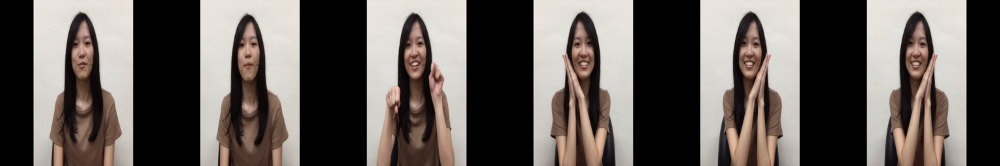

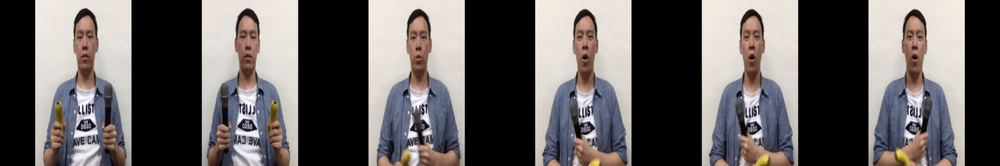

In [9]:
from PIL import Image
import numpy as np
import glob
from random import randint, shuffle

def load_data(file_pattern):
    return glob.glob(file_pattern)

def read_image(fn):
    im = Image.open(fn).convert('RGB')
    im = im.resize( (imageSize, imageSize), Image.BILINEAR ) #Image.BILINEAR是在指定resize的方法，品質較佳
    img = np.array(im)/255*2-1
    
    if randint(0,1): # 以50%機率做水平翻轉
        img=img[:,::-1]
    if channel_first:        
        img = np.moveaxis(img, 2, 0)
    return img


train_A = load_data('frames/cat/*.png')
train_B = load_data('frames/flag/*.png')

def minibatch(data, batchsize):
    length = len(data)
    epoch = i = 0
    tmpsize = None    
    while True:
        size = tmpsize if tmpsize else batchsize
        if i+size > length:
            shuffle(data)
            i = 0
            epoch+=1        
        rtn = [read_image(data[j]) for j in range(i,i+size)]
        i+=size
        tmpsize = yield epoch, np.float32(rtn)       

def minibatchAB(dataA, dataB, batchsize):
    batchA=minibatch(dataA, batchsize)
    batchB=minibatch(dataB, batchsize)
    tmpsize = None    
    while True:        
        ep1, A = batchA.send(tmpsize)
        ep2, B = batchB.send(tmpsize)
        tmpsize = yield max(ep1, ep2), A, B


from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    if channel_first:
        int_X = np.moveaxis(int_X.reshape(-1,3,imageSize,imageSize), 1, 3)
    else:
        int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize, imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))

train_batch = minibatchAB(train_A, train_B, 6)

_, A, B = next(train_batch)
showX(A)
showX(B)
del train_batch, A, B

def G(fn_generate, X):
    r = np.array([fn_generate([X[i:i+1]]) for i in range(X.shape[0])])
    return r.swapaxes(0,1)[:,:,0]

def showG(A,B):
    assert A.shape==B.shape
        
    rA = G(cycleA_generate, A)
    rB = G(cycleB_generate, B)
    arr = np.concatenate([A,B,rA[0],rB[0],rA[1],rB[1]])
    showX(arr, 3)

# Training & Save model

[0/30][1] Loss_D: 0.015581 0.012474 Loss_G: 0.018171 0.062155 loss_cyc 0.015032 18.86717677116394


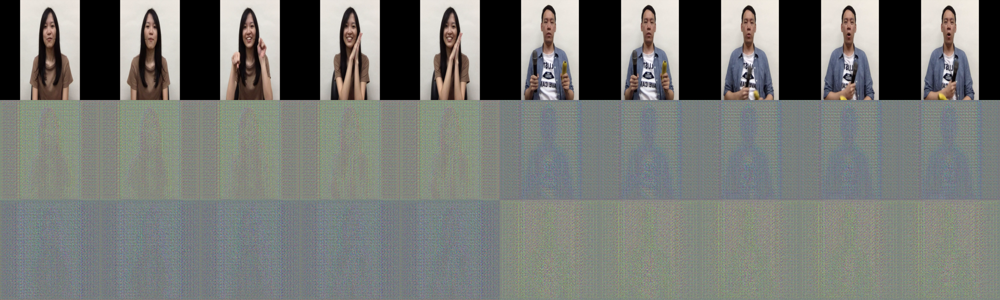

[5/30][1681] Loss_D: 4.763404 4.867881 Loss_G: 9.500117 11.331907 loss_cyc 3.819758 846.9181320667267


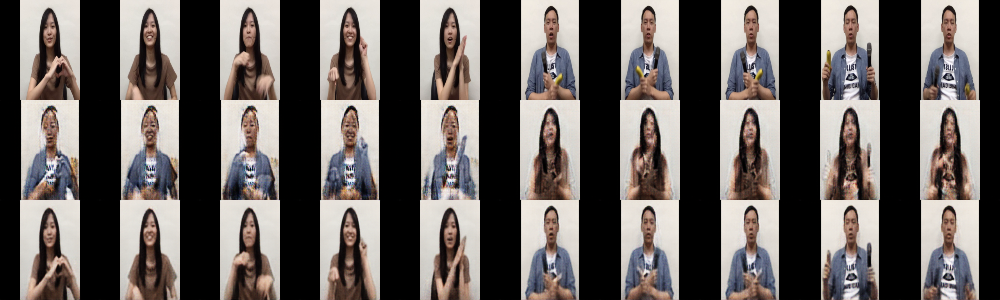

[10/30][3361] Loss_D: 4.268996 4.625888 Loss_G: 5.219184 5.785847 loss_cyc 0.899725 1663.2336909770966


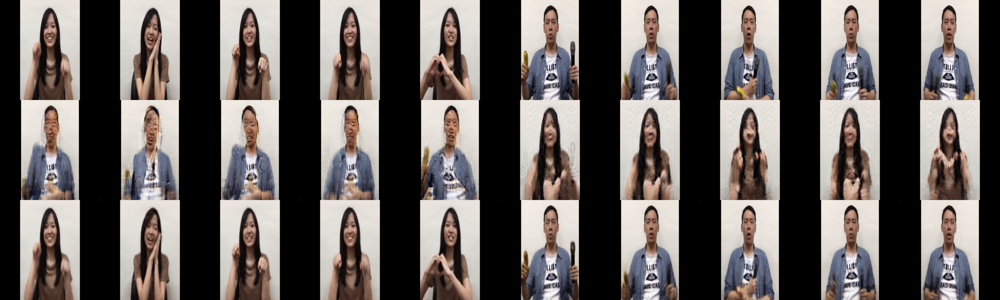

[15/30][5041] Loss_D: 5.370008 4.084449 Loss_G: 6.034529 4.912159 loss_cyc 0.727324 2478.258315563202


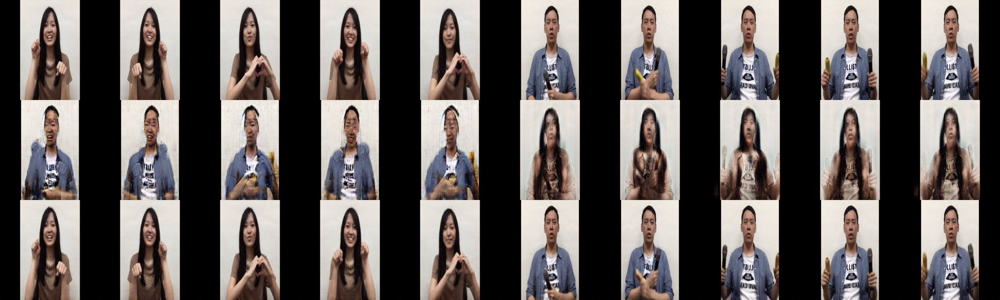

[20/30][6721] Loss_D: 4.380371 4.235642 Loss_G: 4.515577 4.981864 loss_cyc 0.549204 3291.284057855606


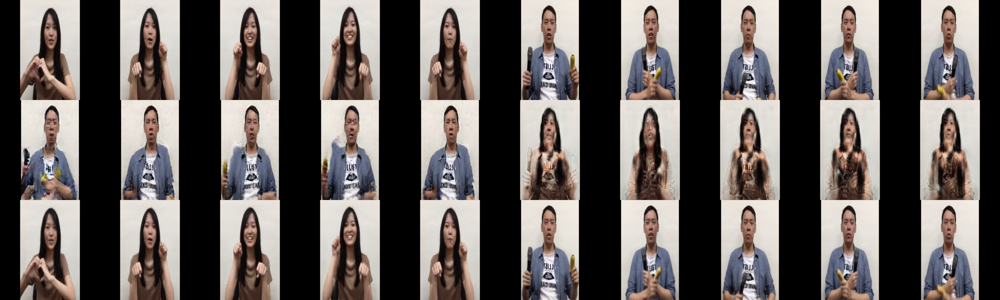

[25/30][8401] Loss_D: 4.325705 4.524502 Loss_G: 4.864146 5.295180 loss_cyc 0.572909 4104.581629276276


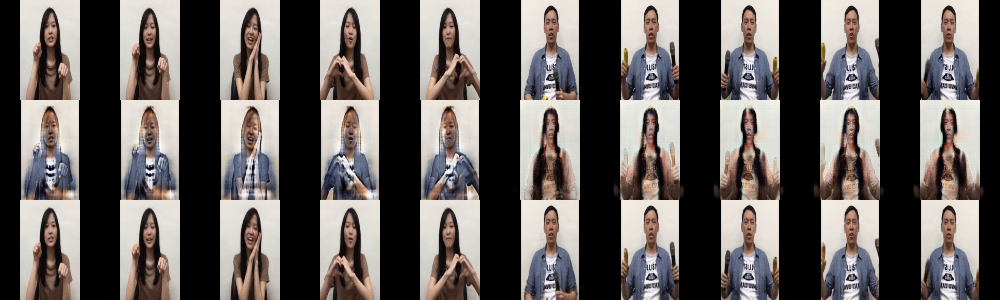

[30/30][10081] Loss_D: 4.293049 4.294538 Loss_G: 4.780564 4.510776 loss_cyc 0.470076 4919.026396751404


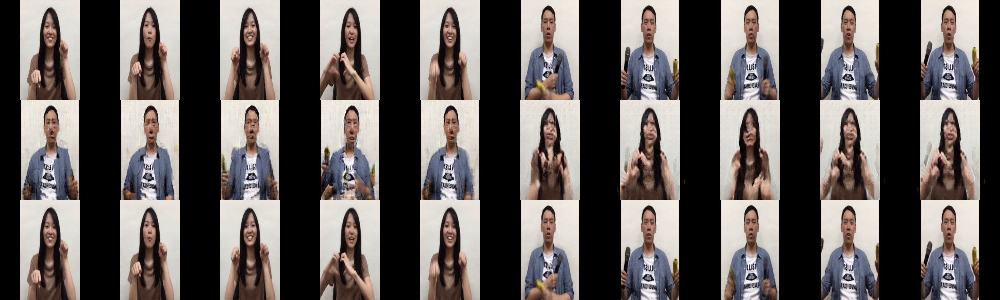

In [10]:
import time
from IPython.display import clear_output
t0 = time.time()
niter = 30
gen_iterations = 0

errCyc_sum = errGA_sum = errGB_sum = errDA_sum = errDB_sum = 0

display_iters = 100 # 幾個iteration要顯示一次圖片
#val_batch = minibatch(valAB, 6, direction)
train_batch = minibatchAB(train_A, train_B, batchSize)

epoch = 0
if not os.path.exists('models/'):
    os.makedirs('models/')
    
while epoch < niter: 

    epoch, A, B = next(train_batch)        
    errDA, errDB  = netD_train([A, B])
    errDA_sum +=errDA
    errDB_sum +=errDB

    # epoch, trainA, trainB = next(train_batch)
    errGA, errGB, errCyc = netG_train([A, B])
    errGA_sum += errGA
    errGB_sum += errGB
    errCyc_sum += errCyc
    gen_iterations+=1
#     if gen_iterations%display_iters==0:
#         print('[%d/%d][%d] Loss_D: %f %f Loss_G: %f %f loss_cyc %f'
#         % (epoch, niter, gen_iterations, errDA_sum/display_iters, errDB_sum/display_iters,
#            errGA_sum/display_iters, errGB_sum/display_iters, 
#            errCyc_sum/display_iters), time.time()-t0)
#         showG(A,B)        
#         errCyc_sum = errGA_sum = errGB_sum = errDA_sum = errDB_sum = 0
        
    if gen_iterations % ((len(train_A)//batchSize)*3) == 1 : #5個epoch存一次
        print('[%d/%d][%d] Loss_D: %f %f Loss_G: %f %f loss_cyc %f'
        % (epoch, niter, gen_iterations, errDA_sum/display_iters, errDB_sum/display_iters,
           errGA_sum/display_iters, errGB_sum/display_iters, 
           errCyc_sum/display_iters), time.time()-t0)
        showG(A,B)
        errCyc_sum = errGA_sum = errGB_sum = errDA_sum = errDB_sum = 0
        
        netGA.save('models/netGA_'+str(epoch)+'.h5')
        netGB.save('models/netGB_'+str(epoch)+'.h5')

## 存最後的model
#netGA.save('netGA.h5')
#netGB.save('netGB.h5')

# Load model

In [11]:
from keras.models import load_model

EPOCH = '30' # 要讀取哪一個epoch的model

netGA = load_model('models/netGA_'+EPOCH+'.h5')
netGB = load_model('models/netGB_'+EPOCH+'.h5')
    
real_A, fake_B, rec_A, cycleA_generate = cycle_variables(netGB, netGA)
real_B, fake_A, rec_B, cycleB_generate = cycle_variables(netGA, netGB)

def np2image(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    if channel_first:
        int_X = np.moveaxis(int_X.reshape(-1,3,imageSize,imageSize), 1, 3)
    else:
        int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize, imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    return Image.fromarray(int_X), int_X

# 將上面的read_image的隨機水平翻轉去掉
def read_image_(fn):
    im = Image.open(fn).convert('RGB')
    im = im.resize( (imageSize, imageSize), Image.BILINEAR ) #Image.BILINEAR是在指定resize的方法，品質較佳
    img = np.array(im)/255*2-1

    if channel_first:        
        img = np.moveaxis(img, 2, 0)
    return img

C:\Users\2080Ti\Anaconda3\lib\site-packages\keras\engine\saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


# Output video

In [12]:
import cv2
fps=30

def output_video(x, filename):
    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v') # mp4的編碼方式
    vwriter = cv2.VideoWriter('video/'+EPOCH+'_'+filename+'.mp4', fourcc, fps, (imageSize,imageSize))
    for i in range(x.shape[0]):
        if x[i].max()<1:
            ima = x[i]*255
        ima = x[i]
        ima = ima[...,[2,1,0]] # RGB to BGR
        ima = ima.astype(np.uint8)
        vwriter.write(ima)

    vwriter.release()

## cat to flag

In [13]:
cat_dire = os.listdir('frames/cat/')
cat_dire.sort(key=lambda s: int(s[-8:-4]))

# cat to flag
cat_video =  np.empty([0, imageSize, imageSize, 3])

for i in range(len(cat_dire)):
    
    cat = 'frames/cat/'+ cat_dire[i]
    cat = read_image_(cat)
    cat = cat.reshape(1,3,256,256)
    rA = G(cycleA_generate, cat)
    img, arr = np2image(rA[0])
    cat_video = np.vstack([cat_video, arr.reshape(1,imageSize, imageSize, 3)])

output_video(cat_video, 'cat2flag')

import gc
del cat_video
gc.collect()

0

## flag to cat

In [14]:
flag_dire = os.listdir('frames/flag')
flag_dire.sort(key=lambda s: int(s[-8:-4]))

# flag to cat
flag_video =  np.empty([0, imageSize, imageSize, 3])
for i in  range(len(flag_dire)):
    flag = 'frames/flag/'+flag_dire[i]
    flag = read_image_(flag)
    flag = flag.reshape(1,3,256,256)
    rB = G(cycleB_generate, flag) 
    img, arr = np2image(rB[0])
    flag_video = np.vstack([flag_video, arr.reshape(1,imageSize, imageSize, 3)])
        
#    save_path = 'output/'+EPOCH+'/flag2cat/'+flag_dire[i]
#    img.save( save_path )

output_video(flag_video, 'flag2cat')
#%%
del flag_video
gc.collect()

0